# Plotting Nonlinearity results

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
# importing the libraries

%matplotlib inline
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import xarray as xr
import netCDF4
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

In [3]:
from scipy import stats

In [4]:
import seaborn as sns

In [5]:
mpl.rcParams['font.family'] = 'Droid Sans'
mpl.rcParams['font.size'] = 12
# Edit axes parameters
mpl.rcParams['axes.linewidth'] = 1.5
# Tick properties
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.minor.size'] = 3
mpl.rcParams['xtick.major.width'] = 1
mpl.rcParams['xtick.direction'] = 'out'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.minor.size'] = 3
mpl.rcParams['ytick.major.width'] = 1
mpl.rcParams['ytick.direction'] = 'out'

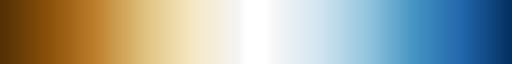

In [6]:
n = 35
diff = 0.5
cmap = plt.cm.BrBG
cmap2 = plt.cm.RdBu
lower = cmap(np.linspace(0, diff, n))
white = np.ones((2, 4))
upper = cmap2(np.linspace(1-diff, 1, n))
colors = np.vstack((lower, white, white, upper))
BrBU = mpl.colors.LinearSegmentedColormap.from_list('map_white', colors)
BrBU

In [7]:
out = xr.open_dataset('./data/result/out_conc.nc')
out

<xarray.Dataset>
Dimensions:      (model: 52, region: 46, season: 5)
Coordinates:
  * model        (model) object 'ACCESS-CM2' 'ACCESS-ESM1-5' ... 'obs' 'rean'
  * region       (region) object 'Greenland/Iceland' ... 'W.Antarctica'
  * season       (season) object 'ANN' 'DJF' 'MAM' 'JJA' 'SON'
Data variables: (12/13)
    std_dev      (model, region, season) float64 ...
    clim         (model, region, season) float64 ...
    corr_coef    (model, region, season) float64 ...
    pval         (model, region, season) float64 ...
    nino         (model, region, season) float64 ...
    nina         (model, region, season) float64 ...
    ...           ...
    enc_pval     (model, region, season) float64 ...
    lnc_pval     (model, region, season) float64 ...
    en_events    (model, season) float64 ...
    ln_events    (model, season) float64 ...
    neut_events  (model, season) float64 ...
    threshold    (model) float64 ...

In [8]:
out.model

<xarray.DataArray 'model' (model: 52)>
array(['ACCESS-CM2', 'ACCESS-ESM1-5', 'AWI-CM-1-1-MR', 'AWI-ESM-1-1-LR',
       'BCC-CSM2-MR', 'BCC-ESM1', 'CAMS-CSM1-0', 'CAS-ESM2-0', 'CESM2',
       'CESM2-FV2', 'CESM2-WACCM', 'CESM2-WACCM-FV2', 'CMCC-CM2-HR4',
       'CMCC-CM2-SR5', 'CNRM-CM6-1', 'CNRM-CM6-1-HR', 'CNRM-ESM2-1', 'CanESM5',
       'E3SM-1-1', 'E3SM-1-1-ECA', 'EC-Earth3', 'EC-Earth3-Veg',
       'EC-Earth3-Veg-LR', 'FGOALS-f3-L', 'FGOALS-g3', 'GFDL-CM4', 'GFDL-ESM4',
       'GISS-E2-1-G', 'GISS-E2-1-G-CC', 'GISS-E2-1-H', 'HadGEM3-GC31-LL',
       'HadGEM3-GC31-MM', 'IITM-ESM', 'INM-CM4-8', 'INM-CM5-0', 'IPSL-CM6A-LR',
       'KACE-1-0-G', 'MIROC-ES2L', 'MIROC6', 'MPI-ESM-1-2-HAM',
       'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'MRI-ESM2-0', 'NESM3', 'NorCPM1',
       'NorESM2-LM', 'NorESM2-MM', 'SAM0-UNICON', 'TaiESM1', 'UKESM1-0-LL',
       'obs', 'rean'], dtype=object)
Coordinates:
  * model    (model) object 'ACCESS-CM2' 'ACCESS-ESM1-5' ... 'obs' 'rean'

In [9]:
model_colors = ['lightcoral', 'indianred', 'tab:brown', 'firebrick', 'maroon', 'red', 'salmon',
                'tab:red', 'sienna', 'chocolate', 'saddlebrown', 'sandybrown', 'darkorange',
                'orange', 'darkgoldenrod', 'goldenrod', 'gold', 'darkkhaki', 'olive', 'yellow',
                'olivedrab', 'tab:green', 'darkolivegreen', 'green', 'limegreen', 'lightseagreen', 'tab:cyan',
                'teal', 'skyblue', 'steelblue', 'tab:blue', 'lightsteelblue', 'royalblue',
                'darkblue', 'blue', 'slateblue', 'mediumpurple', 'indigo', 'darkviolet',
                'plum', 'violet', 'darkmagenta', 'magenta', 'orchid',
                'mediumvioletred', 'deeppink', 'hotpink', 'palevioletred', 'crimson',
                'pink', 'k', 'k']
len(model_colors)

52

In [10]:
# plotting code
import matplotlib as m
from matplotlib.colors import BoundaryNorm as BM


def plot_background(ax):
    ax.add_feature(cfeature.COASTLINE, alpha=0.9, lw=1.1)
    ax.set_global()
    # ax.add_feature(cfeature.LAND, color='lightgray')
    # ax.add_feature(cfeature.OCEAN, color='lightgray')
    gl = ax.gridlines(draw_labels=True,
                      linewidth=1, color='gray', alpha=0.01, linestyle='--')
    gl.top_labels = False
    # gl.left_labels = False
    # gl.bottom_labels = False
    gl.right_labels = False
    gl.xlines = False
    # gl.xlocator = mticker.FixedLocator([-180, -45, 0, 45, 180])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 10, 'color': 'k'}
    gl.ylabel_style = {'size': 10, 'color': 'k'}
    return ax

# plotting function for the case of general pval
def plot(z, titles, cmap, vmin, vmax, cbar_label = 'Precip', pval = [], pval_mme=[], nrows=1, ncols=3, figsize=(12,4), ocean_mask_list = []):
    cmap.set_bad('white',1.)
    pg = regionmask.defined_regions.ar6.land.polygons
    fig, axarr = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, constrained_layout=True, subplot_kw={'projection':ccrs.Robinson(central_longitude=0)})
    
    axlist = axarr.flatten()
    
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    for i in range(len(z)):
        min_val, max_val = min(z[i]), max(z[i])
        # colors = cmap(plt.Normalize(min_val, max_val)(z[i]))
        colors = cmap(plt.Normalize(vmin, vmax)(z[i]))
        
        for j in range(len(z[i])):
            if pval != [] and pval_mme == []:
                if pval[i][j] > 0.05:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='/////')
                else:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
            elif pval == [] and pval_mme != []:
                if pval_mme[i][j] < 0.52:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='/////')
                else:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
            else:
                axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
        axlist[i].set_title(titles[i])
        if i in ocean_mask_list:
            axlist[i].add_feature(cfeature.OCEAN, color = 'white', zorder=1)
            
    for ax in axlist:
        plot_background(ax)
        
    plt.colorbar(m.cm.ScalarMappable(norm = norm, cmap=cmap), ax = axlist, \
                orientation = 'vertical', shrink=0.7, aspect = 20, pad = 0.01, label = cbar_label)


# plotting function for the case of enc and lnc pval
def plot2(z, titles, cmap, vmin, vmax, cbar_label = 'Precip', pval1 = [], pval2=[], kind='sign_ratio', nrows=1, ncols=3, figsize=(12,4), ocean_mask_list = []):
    cmap.set_bad('white',1.)
    pg = regionmask.defined_regions.ar6.land.polygons
    fig, axarr = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, constrained_layout=True, subplot_kw={'projection':ccrs.Robinson(central_longitude=0)})
    
    axlist = axarr.flatten()
    
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    for i in range(len(z)):
        min_val, max_val = min(z[i]), max(z[i])
        # colors = cmap(plt.Normalize(min_val, max_val)(z[i]))
        colors = cmap(plt.Normalize(vmin, vmax)(z[i]))
        
        # change w.r.t main plot fuunction is here
        for j in range(len(z[i])):
            if kind == 'pval':
                if pval1[i][j] > 0.05 and pval2[i][j] > 0.05:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='/////')
                else:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
            elif kind == 'sign_ratio':
                if pval1[i][j] < 0.52 and pval2[i][j] < 0.52:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='/////')
                else:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
            else:
                axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
        axlist[i].set_title(titles[i])
        if i in ocean_mask_list:
            axlist[i].add_feature(cfeature.OCEAN, color = 'white', zorder=1)
            
    for ax in axlist:
        plot_background(ax)
        
    plt.colorbar(m.cm.ScalarMappable(norm = norm, cmap=cmap), ax = axlist, \
                orientation = 'vertical', shrink=0.7, aspect = 20, pad = 0.01, label = cbar_label)

In [11]:
import seaborn as sns

In [12]:
import regionmask

In [13]:
region_names = regionmask.defined_regions.ar6.land.to_dataframe()['names'].to_numpy()
region_names

array(['Greenland/Iceland', 'N.W.North-America', 'N.E.North-America',
       'W.North-America', 'C.North-America', 'E.North-America',
       'N.Central-America', 'S.Central-America', 'Caribbean',
       'N.W.South-America', 'N.South-America', 'N.E.South-America',
       'South-American-Monsoon', 'S.W.South-America', 'S.E.South-America',
       'S.South-America', 'N.Europe', 'West&Central-Europe', 'E.Europe',
       'Mediterranean', 'Sahara', 'Western-Africa', 'Central-Africa',
       'N.Eastern-Africa', 'S.Eastern-Africa', 'W.Southern-Africa',
       'E.Southern-Africa', 'Madagascar', 'Russian-Arctic', 'W.Siberia',
       'E.Siberia', 'Russian-Far-East', 'W.C.Asia', 'E.C.Asia',
       'Tibetan-Plateau', 'E.Asia', 'Arabian-Peninsula', 'S.Asia',
       'S.E.Asia', 'N.Australia', 'C.Australia', 'E.Australia',
       'S.Australia', 'New-Zealand', 'E.Antarctica', 'W.Antarctica'],
      dtype=object)

In [14]:
save_loc = './images/regional/'

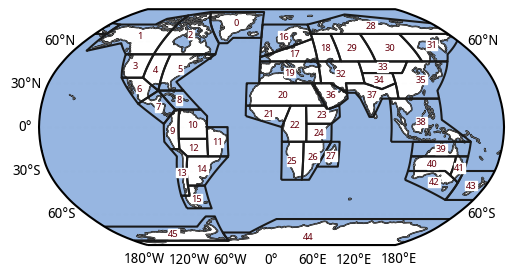

In [15]:
fig = plt.figure(figsize=(6,5))
ax = plt.axes(projection = ccrs.Robinson())
ax.coastlines(lw=0.7, alpha=0.7)
plot_background(ax)
text_kws = dict(color="#67000d", fontsize=7, bbox=dict(pad=0.2, color="w"))
regionmask.defined_regions.ar6.land.plot(text_kws=text_kws, add_ocean=True)
plt.savefig(save_loc+'supplementary/regions.png', dpi=300, bbox_inches='tight')

## OBS plots

#### clim

In [16]:
clim_list = [out.isel(season = 0, model = -2).clim,
             out.isel(season = 1, model = -2).clim,
             out.isel(season = 2, model = -2).clim,
             out.isel(season = 3, model = -2).clim,
             out.isel(season = 4, model = -2).clim]

In [17]:
title_list = ['ANN CLIM', 'DJF CLIM', 'MAM CLIM', 'JJA CLIM', 'SON CLIM']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

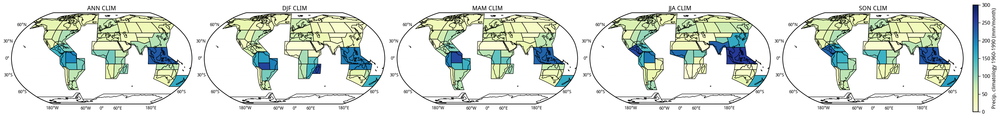

In [18]:
plot(clim_list, title_list, mpl.cm.YlGnBu, vmin=0, vmax=300, cbar_label = 'Precip. climatology 1960-1990 (mm/month)', pval = [], \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig(save_loc+'/supplementary/obs_clim.png', dpi=300, bbox_inches='tight')

#### std

In [21]:
std_list = [out.isel(season = 0, model = -2).std_dev,
             out.isel(season = 1, model = -2).std_dev,
             out.isel(season = 2, model = -2).std_dev,
             out.isel(season = 3, model = -2).std_dev,
             out.isel(season = 4, model = -2).std_dev]

In [22]:
title_list = ['ANN STD', 'DJF STD', 'MAM STD', 'JJA STD', 'SON STD']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

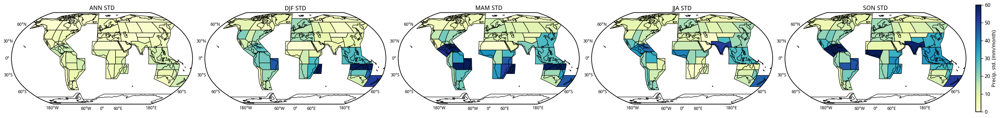

In [23]:
plot(std_list, title_list, mpl.cm.YlGnBu, vmin=0, vmax=60, cbar_label = 'Precip. std. (mm/month)', pval = [], \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig(save_loc + '/supplementary/obs_std.png', dpi=300, bbox_inches='tight')

#### corr

In [15]:
corr_list = [out.isel(season = 0, model = -2).corr_coef,
             out.isel(season = 1, model = -2).corr_coef,
             out.isel(season = 2, model = -2).corr_coef,
             out.isel(season = 3, model = -2).corr_coef,
             out.isel(season = 4, model = -2).corr_coef]

In [16]:
pval_list = [out.isel(season = 0, model = -2).pval, 
             out.isel(season = 1, model = -2).pval,
             out.isel(season = 2, model = -2).pval,
             out.isel(season = 3, model = -2).pval,
             out.isel(season = 4, model = -2).pval]

In [17]:
title_list = ['ANN CORR', 'DJF CORR', 'MAM CORR', 'JJA CORR', 'SON CORR']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

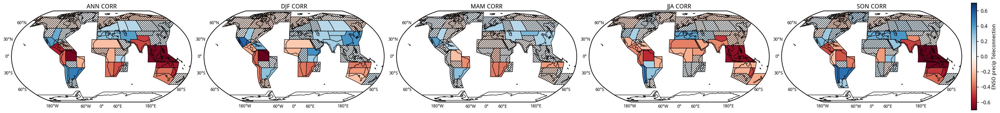

In [18]:
plot(corr_list, title_list, mpl.cm.RdBu, vmin=-0.7, vmax=0.7, cbar_label = 'ENSO precip Teleconnection', pval = pval_list, \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig(save_loc+'supplementary/obs_corr.png', dpi=300, bbox_inches='tight')

#### ANN figures

In [28]:
plot_list = [out.isel(season = 0, model = -2).nino, 
             out.isel(season = 0, model = -2).nina,
             out.isel(season = 0, model = -2).neut]

In [29]:
pval_list = [out.isel(season = 0, model = -2).pval.to_numpy(), 
             out.isel(season = 0, model = -2).pval.to_numpy(),
             out.isel(season = 0, model = -2).pval.to_numpy()]

In [30]:
title_list = ['ANN NINO',
              'ANN NINA',
              'ANN NEUT']

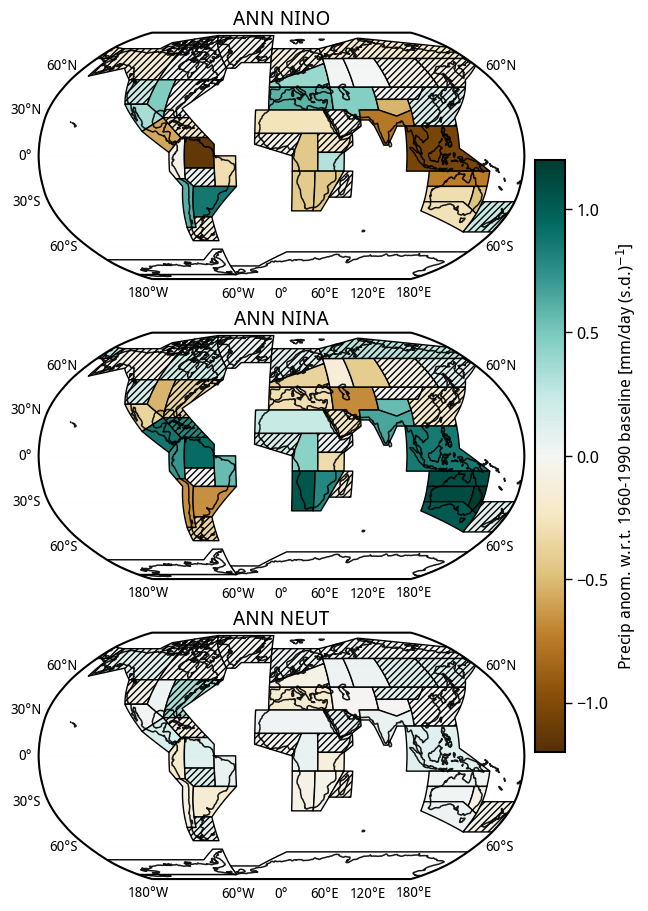

In [31]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-1.2, vmax=1.2, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/day (s.d.)$^{-1}$]', pval = pval_list, \
     nrows=3, ncols=1, figsize=(12,9), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/ann_figures/obs_enso_state.png', dpi=300, bbox_inches='tight')

In [19]:
out['enc'] = out.nino - out.neut
out['lnc'] = out.nina - out.neut
out['asymm'] = (out.enc + out.lnc)/2
out['symm'] = (out.enc - out.lnc)/2

In [33]:
plot_list = [out.isel(season = 0, model = -2).enc, 
             out.isel(season = 0, model = -2).lnc]

In [34]:
pval_list = [out.isel(season = 0, model = -2).enc_pval.to_numpy(), 
             out.isel(season = 0, model = -2).lnc_pval.to_numpy()]

In [35]:
title_list = ['ANN ENC',
              'ANN LNC']

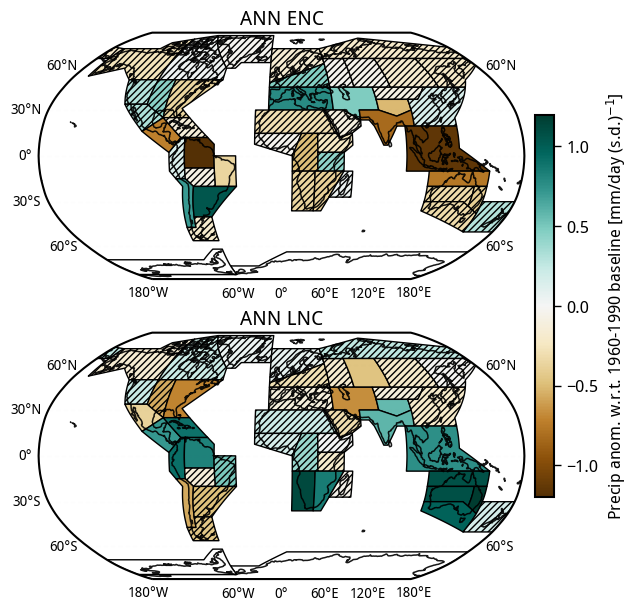

In [36]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-1.2, vmax=1.2, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/day (s.d.)$^{-1}$]', pval = pval_list, \
     nrows=2, ncols=1, figsize=(12,6), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/ann_figures/obs_enso_change.png', dpi=300, bbox_inches='tight')

In [37]:
plot_list = [out.isel(season = 0, model = -2).asymm,
             out.isel(season = 0, model = -2).symm]

In [38]:
pval_list1 = [out.isel(season = 0, model = -2).enc_pval.to_numpy(),
              out.isel(season = 0, model = -2).enc_pval.to_numpy()]
pval_list2 = [out.isel(season = 0, model = -2).lnc_pval.to_numpy(),
              out.isel(season = 0, model = -2).lnc_pval.to_numpy()]
pval_list = [out.isel(season = 0, model = -2).pval.to_numpy(),
             out.isel(season = 0, model = -2).pval.to_numpy()]

In [39]:
title_list = ['ANN ASYMM',
              'ANN SYMM']

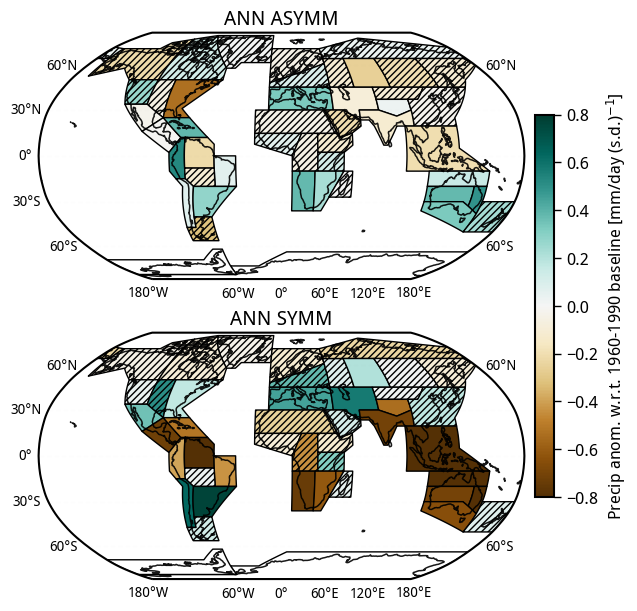

In [40]:
plot2(plot_list, title_list, mpl.cm.BrBG, vmin=-0.8, vmax=0.8, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/day (s.d.)$^{-1}$]', pval1 = pval_list1, \
     pval2 = pval_list2, kind = 'pval', nrows=2, ncols=1, figsize=(12,6), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/ann_figures/obs_asymm_symm.png', dpi=300, bbox_inches='tight')

#### seasonal figures

In [41]:
plot_list = [out.isel(season = 1, model = -2).nino, 
             out.isel(season = 2, model = -2).nino,
             out.isel(season = 3, model = -2).nino,
             out.isel(season = 4, model = -2).nino,
             out.isel(season = 1, model = -2).nina,
             out.isel(season = 2, model = -2).nina,
             out.isel(season = 3, model = -2).nina,
             out.isel(season = 4, model = -2).nina,
             out.isel(season = 1, model = -2).neut,
             out.isel(season = 2, model = -2).neut,
             out.isel(season = 3, model = -2).neut,
             out.isel(season = 4, model = -2).neut]

In [42]:
pval_list = [out.isel(season = 1, model = -2).pval, 
             out.isel(season = 2, model = -2).pval,
             out.isel(season = 3, model = -2).pval,
             out.isel(season = 4, model = -2).pval,
             out.isel(season = 1, model = -2).pval,
             out.isel(season = 2, model = -2).pval,
             out.isel(season = 3, model = -2).pval,
             out.isel(season = 4, model = -2).pval,
             out.isel(season = 1, model = -2).pval,
             out.isel(season = 2, model = -2).pval,
             out.isel(season = 3, model = -2).pval,
             out.isel(season = 4, model = -2).pval]

In [43]:
title_list = ['DJF NINO', 'MAM NINO', 'JJA NINO', 'SON NINO',
              'DJF NINA', 'MAM NINA', 'JJA NINA', 'SON NINA',
              'DJF NEUT', 'MAM NEUT', 'JJA NEUT', 'SON NEUT']

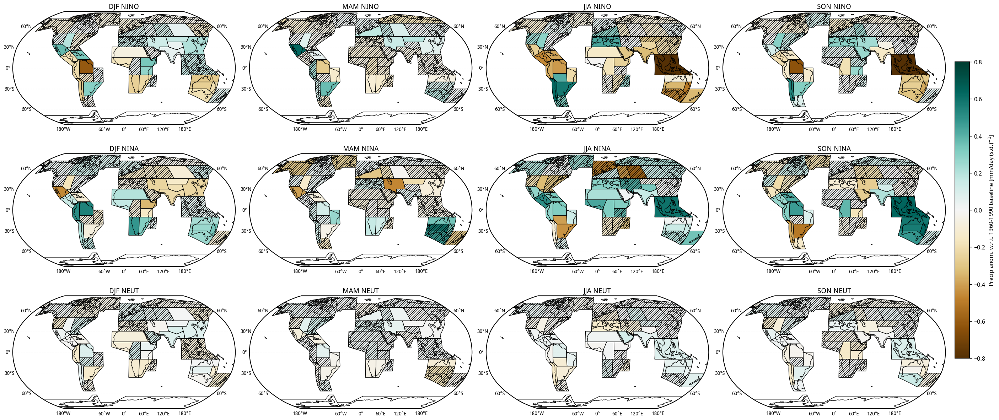

In [44]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-0.8, vmax=0.8, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/day (s.d.)$^{-1}$]', pval = pval_list, \
     nrows=3, ncols=4, figsize=(28,12), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/seasonal_figures/obs_enso_state.png', dpi=300, bbox_inches='tight')

In [45]:
plot_list = [out.isel(season = 1, model = -2).enc, 
             out.isel(season = 2, model = -2).enc,
             out.isel(season = 3, model = -2).enc,
             out.isel(season = 4, model = -2).enc,
             out.isel(season = 1, model = -2).lnc,
             out.isel(season = 2, model = -2).lnc,
             out.isel(season = 3, model = -2).lnc,
             out.isel(season = 4, model = -2).lnc]

In [46]:
pval_list = [out.isel(season = 1, model = -2).enc_pval.to_numpy(), 
             out.isel(season = 2, model = -2).enc_pval.to_numpy(),
             out.isel(season = 3, model = -2).enc_pval.to_numpy(),
             out.isel(season = 4, model = -2).enc_pval.to_numpy(),
             out.isel(season = 1, model = -2).lnc_pval.to_numpy(),
             out.isel(season = 2, model = -2).lnc_pval.to_numpy(),
             out.isel(season = 3, model = -2).lnc_pval.to_numpy(),
             out.isel(season = 4, model = -2).lnc_pval.to_numpy()]

In [47]:
title_list = ['DJF ENC', 'MAM ENC', 'JJA ENC', 'SON ENC',
              'DJF LNC', 'MAM LNC', 'JJA LNC', 'SON LNC']

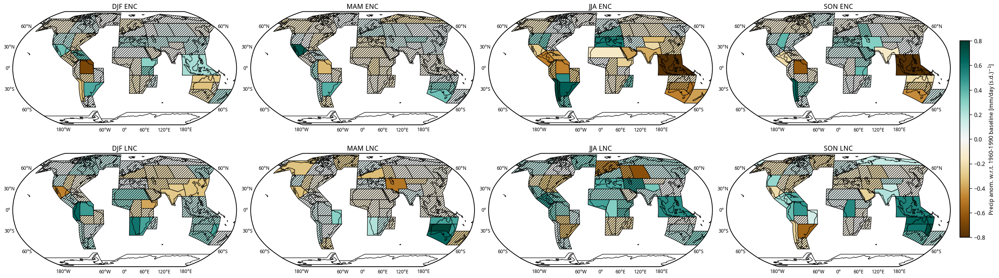

In [48]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-0.8, vmax=0.8, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/day (s.d.)$^{-1}$]', pval = pval_list, \
     nrows=2, ncols=4, figsize=(28,8), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/seasonal_figures/obs_enso_change.png', dpi=300, bbox_inches='tight')

In [49]:
plot_list = [out.isel(season = 1, model = -2).asymm, 
             out.isel(season = 2, model = -2).asymm,
             out.isel(season = 3, model = -2).asymm,
             out.isel(season = 4, model = -2).asymm]

In [50]:
pval_list = [out.isel(season = 1, model = -2).pval.to_numpy(), 
             out.isel(season = 2, model = -2).pval.to_numpy(),
             out.isel(season = 3, model = -2).pval.to_numpy(),
             out.isel(season = 4, model = -2).pval.to_numpy()]

pval_list1 = [out.isel(season = 1, model = -2).enc_pval.to_numpy(), 
             out.isel(season = 2, model = -2).enc_pval.to_numpy(),
             out.isel(season = 3, model = -2).enc_pval.to_numpy(),
             out.isel(season = 4, model = -2).enc_pval.to_numpy()]

pval_list2 = [out.isel(season = 1, model = -2).lnc_pval.to_numpy(), 
             out.isel(season = 2, model = -2).lnc_pval.to_numpy(),
             out.isel(season = 3, model = -2).lnc_pval.to_numpy(),
             out.isel(season = 4, model = -2).lnc_pval.to_numpy()]

In [51]:
title_list = ['DJF ASYMM', 'MAM ASYMM', 'JJA ASYMM', 'SON ASYMM']

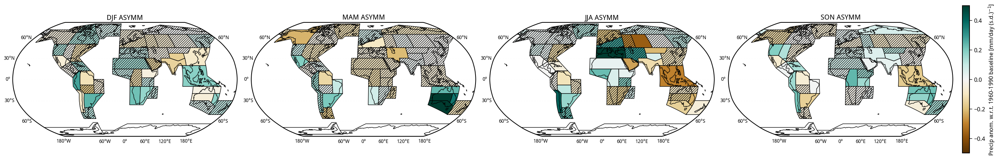

In [52]:
plot2(plot_list, title_list, mpl.cm.BrBG, vmin=-0.5, vmax=0.5, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/day (s.d.)$^{-1}$]', pval1 = pval_list1, \
     pval2 = pval_list2, kind='pval', nrows=1, ncols=4, figsize=(28,6), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/seasonal_figures/obs_asymm.png', dpi=300, bbox_inches='tight')

## MME plots

In [20]:
import os
model_list = sorted(os.listdir('/scratch/ob22/as8561/data/preproc//'))[1:]

In [21]:
model_list

['ACCESS-CM2',
 'ACCESS-ESM1-5',
 'AWI-CM-1-1-MR',
 'AWI-ESM-1-1-LR',
 'BCC-CSM2-MR',
 'BCC-ESM1',
 'CAMS-CSM1-0',
 'CAS-ESM2-0',
 'CESM2',
 'CESM2-FV2',
 'CESM2-WACCM',
 'CESM2-WACCM-FV2',
 'CMCC-CM2-HR4',
 'CMCC-CM2-SR5',
 'CNRM-CM6-1',
 'CNRM-CM6-1-HR',
 'CNRM-ESM2-1',
 'CanESM5',
 'E3SM-1-1',
 'E3SM-1-1-ECA',
 'EC-Earth3',
 'EC-Earth3-Veg',
 'EC-Earth3-Veg-LR',
 'FGOALS-f3-L',
 'FGOALS-g3',
 'FIO-ESM-2-0',
 'GFDL-CM4',
 'GFDL-ESM4',
 'GISS-E2-1-G',
 'GISS-E2-1-G-CC',
 'GISS-E2-1-H',
 'HadGEM3-GC31-LL',
 'HadGEM3-GC31-MM',
 'IITM-ESM',
 'INM-CM4-8',
 'INM-CM5-0',
 'IPSL-CM6A-LR',
 'KACE-1-0-G',
 'MCM-UA-1-0',
 'MIROC-ES2L',
 'MIROC6',
 'MPI-ESM-1-2-HAM',
 'MPI-ESM1-2-HR',
 'MPI-ESM1-2-LR',
 'MRI-ESM2-0',
 'NESM3',
 'NorCPM1',
 'NorESM2-LM',
 'NorESM2-MM',
 'SAM0-UNICON',
 'TaiESM1',
 'UKESM1-0-LL',
 'obs',
 'rean']

In [22]:
# def plot_scatter(da, var):
#     for j in range(len(da.model)):
#         if da.model[j] == 'obs' or da.model[j] == 'rean':
#             (da.isel(model = j)[var]).drop(['model', 'region']).plot.scatter(color = model_colors[j], marker = 'D', alpha = 0.9, s = 80, facecolor='white', label = model_list[j])
#         else:
#             (da.isel(model = j)[var]).drop(['model', 'region']).plot.scatter(color = model_colors[j], marker = 'o', alpha = 0.4, s = 10, facecolor='white', label = model_list[j])
#     (da.isel(model = slice(0, -2))[var]).mean('model').drop(['region']).plot.scatter(color = 'tab:red', marker='D', alpha = 0.9, s = 80, facecolor='white', label = 'mme')

### creating mme dataset

In [19]:
def get_sig1d(x):
    sig_models = len(x[x < 0.05])
    tot_models = len(x)
    return float(sig_models/tot_models)


def get_sign3d(da, dim):
    return xr.apply_ufunc(get_sig1d, da, input_core_dims=[[dim]], vectorize=True, dask='parallelized')

In [20]:
out

<xarray.Dataset>
Dimensions:      (model: 52, region: 46, season: 5)
Coordinates:
  * model        (model) object 'ACCESS-CM2' 'ACCESS-ESM1-5' ... 'obs' 'rean'
  * region       (region) object 'Greenland/Iceland' ... 'W.Antarctica'
  * season       (season) object 'ANN' 'DJF' 'MAM' 'JJA' 'SON'
Data variables: (12/13)
    std_dev      (model, region, season) float64 ...
    clim         (model, region, season) float64 ...
    corr_coef    (model, region, season) float64 ...
    pval         (model, region, season) float64 ...
    nino         (model, region, season) float64 ...
    nina         (model, region, season) float64 ...
    ...           ...
    enc_pval     (model, region, season) float64 ...
    lnc_pval     (model, region, season) float64 ...
    en_events    (model, season) float64 ...
    ln_events    (model, season) float64 ...
    neut_events  (model, season) float64 ...
    threshold    (model) float64 ...

In [21]:
mme_ds = out.isel(model = slice(0,-2)).drop(['pval', 'enc_pval', 'lnc_pval']).mean('model')
# mme_ds = out.isel(model = slice(0,-2)).drop(['pval', 'enc_pval', 'lnc_pval']).drop([model_list[17], model_list[27]], dim='model').mean('model')

In [22]:
mme_ds['sign_ratio'] = get_sign3d(out.isel(model = slice(0,-2)).pval, dim='model')
mme_ds['enc_sign_ratio'] = get_sign3d(out.isel(model = slice(0,-2)).enc_pval, dim='model')
mme_ds['lnc_sign_ratio'] = get_sign3d(out.isel(model = slice(0,-2)).lnc_pval, dim='model')

In [23]:
mme_ds

<xarray.Dataset>
Dimensions:         (region: 46, season: 5)
Coordinates:
  * region          (region) object 'Greenland/Iceland' ... 'W.Antarctica'
  * season          (season) object 'ANN' 'DJF' 'MAM' 'JJA' 'SON'
Data variables: (12/13)
    std_dev         (region, season) float64 3.419 9.275 8.405 ... 10.52 10.3
    clim            (region, season) float64 35.1 30.2 28.72 ... 41.37 35.95
    corr_coef       (region, season) float64 0.0153 0.04729 ... 0.05112 0.04147
    nino            (region, season) float64 0.001959 0.02153 ... 0.06106
    nina            (region, season) float64 -0.0533 -0.07093 ... -0.02303
    neut            (region, season) float64 -0.002806 0.01157 ... -0.02013
    ...              ...
    ln_events       (season) float64 14.8 23.94 16.66 11.28 18.84
    neut_events     (season) float64 49.54 36.88 44.04 53.58 44.62
    threshold       float64 0.9736
    sign_ratio      (region, season) float64 0.1 0.24 0.22 0.04 ... 0.24 0.2 0.2
    enc_sign_ratio  (region, season) float64 0.04 0.04 0.06 ... 0.1 0.14 0.22
    lnc_sign_ratio  (region, season) float64 0.06 0.12 0.08 ... 0.02 0.06 0.02

#### clim

In [28]:
clim_list = [mme_ds.isel(season = 0).clim,
             mme_ds.isel(season = 1).clim,
             mme_ds.isel(season = 2).clim,
             mme_ds.isel(season = 3).clim,
             mme_ds.isel(season = 4).clim]

In [29]:
title_list = ['ANN CLIM', 'DJF CLIM', 'MAM CLIM', 'JJA CLIM', 'SON CLIM']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

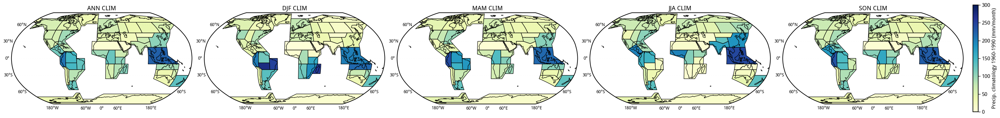

In [30]:
plot(clim_list, title_list, mpl.cm.YlGnBu, vmin=0, vmax=300, cbar_label = 'Precip. climatology 1960-1990 (mm/month)', pval = [], \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig(save_loc+'supplementary/mme_clim.png', dpi=300, bbox_inches='tight')

#### std

In [31]:
std_list = [mme_ds.isel(season = 0).std_dev,
            mme_ds.isel(season = 1).std_dev,
            mme_ds.isel(season = 2).std_dev,
            mme_ds.isel(season = 3).std_dev,
            mme_ds.isel(season = 4).std_dev]

In [32]:
title_list = ['ANN STD', 'DJF STD', 'MAM STD', 'JJA STD', 'SON STD']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

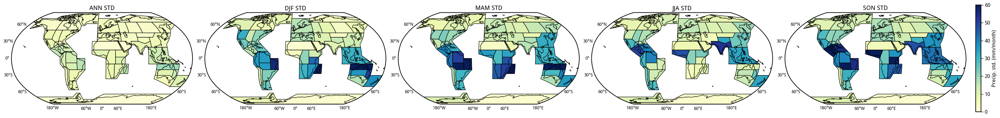

In [33]:
plot(std_list, title_list, mpl.cm.YlGnBu, vmin=0, vmax=60, cbar_label = 'Precip. std. (mm/month)', pval = [], \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig(save_loc + 'supplementary/mme_std.png', dpi=300, bbox_inches='tight')

#### corr

In [37]:
corr_list = [mme_ds.isel(season = 0).corr_coef,
             mme_ds.isel(season = 1).corr_coef,
             mme_ds.isel(season = 2).corr_coef,
             mme_ds.isel(season = 3).corr_coef,
             mme_ds.isel(season = 4).corr_coef]

In [38]:
pval_list = [mme_ds.isel(season = 0).sign_ratio, 
             mme_ds.isel(season = 1).sign_ratio,
             mme_ds.isel(season = 2).sign_ratio,
             mme_ds.isel(season = 3).sign_ratio,
             mme_ds.isel(season = 4).sign_ratio]

In [39]:
title_list = ['ANN CORR', 'DJF CORR', 'MAM CORR', 'JJA CORR', 'SON CORR']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

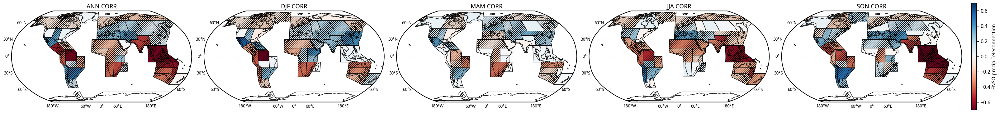

In [24]:
plot(corr_list, title_list, mpl.cm.RdBu, vmin=-0.7, vmax=0.7, cbar_label = 'ENSO precip Teleconnection', pval_mme = pval_list, \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig(save_loc+'supplementary/mme_corr.png', dpi=300, bbox_inches='tight')

##### ANN figures

In [41]:
plot_list = [mme_ds.isel(season = 0).nino, 
             mme_ds.isel(season = 0).nina,
             mme_ds.isel(season = 0).neut]

In [42]:
pval_list = [mme_ds.isel(season = 0).sign_ratio.to_numpy(), 
             mme_ds.isel(season = 0).sign_ratio.to_numpy(),
             mme_ds.isel(season = 0).sign_ratio.to_numpy()]

In [43]:
title_list = ['ANN NINO',
              'ANN NINA',
              'ANN NEUT']

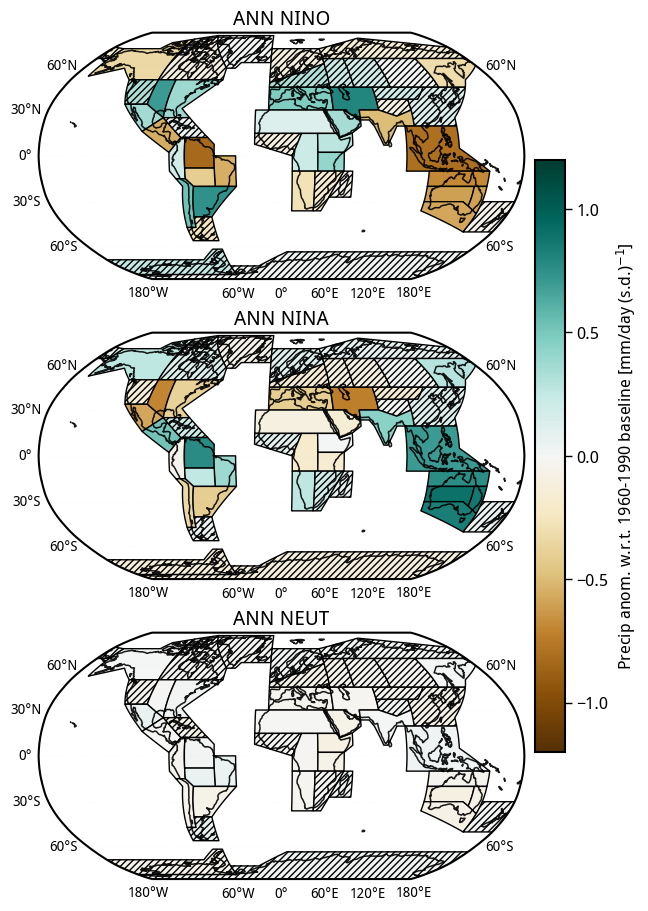

In [44]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-1.2, vmax=1.2, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/day (s.d.)$^{-1}$]', pval_mme = pval_list, \
     nrows=3, ncols=1, figsize=(12,9), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/ann_figures/mme_enso_state.png', dpi=300, bbox_inches='tight')

In [45]:
mme_ds['enc'] = mme_ds.nino - mme_ds.neut
mme_ds['lnc'] = mme_ds.nina - mme_ds.neut
mme_ds['asymm'] = (mme_ds.enc + mme_ds.lnc)/2
mme_ds['symm'] = (mme_ds.enc - mme_ds.lnc)/2

In [46]:
plot_list = [mme_ds.isel(season = 0).enc, 
             mme_ds.isel(season = 0).lnc]

In [47]:
pval_list = [mme_ds.isel(season = 0).enc_sign_ratio.to_numpy(), 
             mme_ds.isel(season = 0).lnc_sign_ratio.to_numpy()]

In [48]:
title_list = ['ANN ENC',
              'ANN LNC']

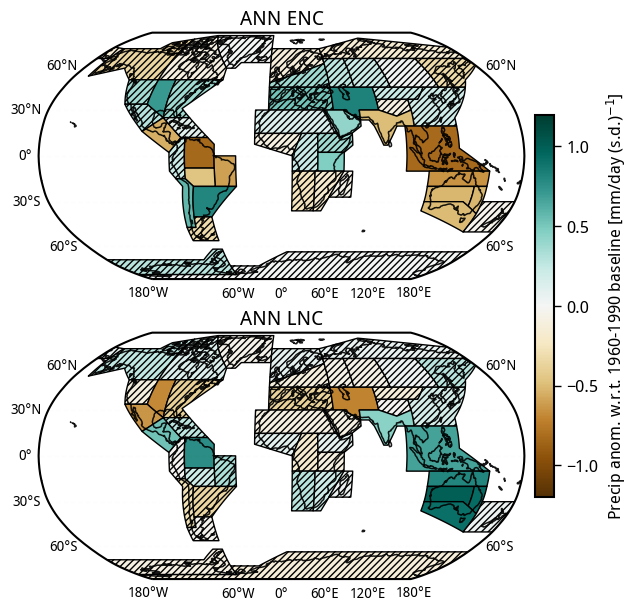

In [49]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-1.2, vmax=1.2, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/day (s.d.)$^{-1}$]', pval_mme = pval_list, \
     nrows=2, ncols=1, figsize=(12,6), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/ann_figures/mme_enso_change.png', dpi=300, bbox_inches='tight')

In [50]:
plot_list = [mme_ds.isel(season = 0).asymm,
             mme_ds.isel(season = 0).symm]

In [51]:
pval_list1 = [mme_ds.isel(season = 0).enc_sign_ratio.to_numpy(),
              mme_ds.isel(season = 0).enc_sign_ratio.to_numpy()]
pval_list2 = [mme_ds.isel(season = 0).lnc_sign_ratio.to_numpy(),
              mme_ds.isel(season = 0).lnc_sign_ratio.to_numpy()]
pval_list = [mme_ds.isel(season = 0).sign_ratio.to_numpy(),
             mme_ds.isel(season = 0).sign_ratio.to_numpy()]

In [52]:
title_list = ['ANN ASYMM',
              'ANN SYMM']

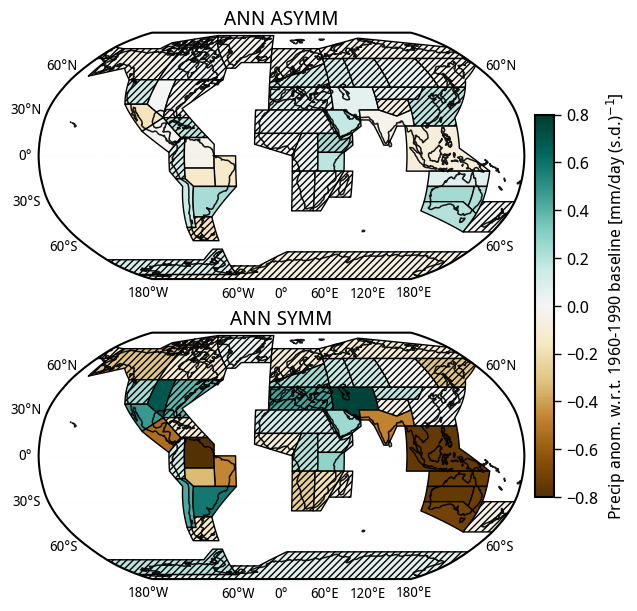

In [53]:
plot2(plot_list, title_list, mpl.cm.BrBG, vmin=-0.8, vmax=0.8, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/day (s.d.)$^{-1}$]', pval1 = pval_list1, \
     pval2 = pval_list2, kind = 'sign_ratio', nrows=2, ncols=1, figsize=(12,6), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/ann_figures/mme_asymm_symm.png', dpi=300, bbox_inches='tight')

#### seasonal figures

In [54]:
plot_list = [mme_ds.isel(season = 1).nino, 
             mme_ds.isel(season = 2).nino,
             mme_ds.isel(season = 3).nino,
             mme_ds.isel(season = 4).nino,
             mme_ds.isel(season = 1).nina,
             mme_ds.isel(season = 2).nina,
             mme_ds.isel(season = 3).nina,
             mme_ds.isel(season = 4).nina,
             mme_ds.isel(season = 1).neut,
             mme_ds.isel(season = 2).neut,
             mme_ds.isel(season = 3).neut,
             mme_ds.isel(season = 4).neut]

In [55]:
pval_list = [mme_ds.isel(season = 1).sign_ratio.to_numpy(), 
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy(),
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy(),
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy()]

In [56]:
title_list = ['DJF NINO', 'MAM NINO', 'JJA NINO', 'SON NINO',
              'DJF NINA', 'MAM NINA', 'JJA NINA', 'SON NINA',
              'DJF NEUT', 'MAM NEUT', 'JJA NEUT', 'SON NEUT']

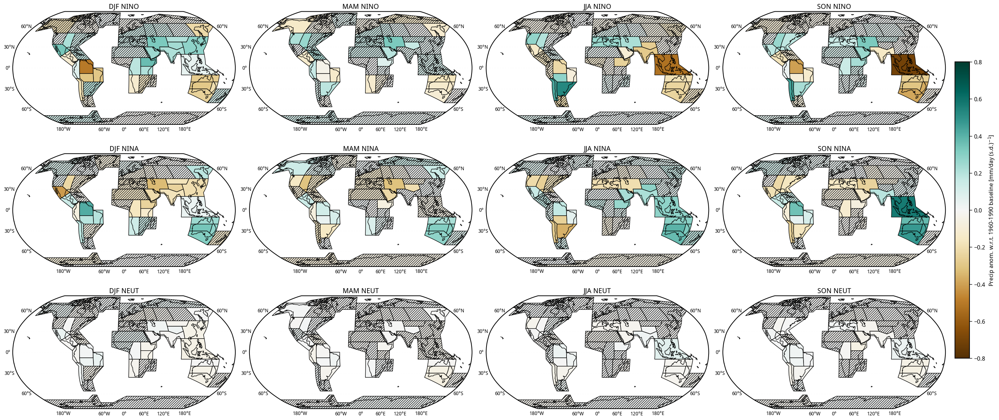

In [57]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-0.8, vmax=0.8, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/day (s.d.)$^{-1}$]', pval_mme = pval_list, \
     nrows=3, ncols=4, figsize=(28,12), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/seasonal_figures/mme_enso_state.png', dpi=300, bbox_inches='tight')

In [58]:
plot_list = [mme_ds.isel(season = 1).enc, 
             mme_ds.isel(season = 2).enc,
             mme_ds.isel(season = 3).enc,
             mme_ds.isel(season = 4).enc,
             mme_ds.isel(season = 1).lnc,
             mme_ds.isel(season = 2).lnc,
             mme_ds.isel(season = 3).lnc,
             mme_ds.isel(season = 4).lnc]

In [59]:
pval_list = [mme_ds.isel(season = 1).enc_sign_ratio.to_numpy(), 
             mme_ds.isel(season = 2).enc_sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).enc_sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).enc_sign_ratio.to_numpy(),
             mme_ds.isel(season = 1).lnc_sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).lnc_sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).lnc_sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).lnc_sign_ratio.to_numpy()]

In [60]:
title_list = ['DJF ENC', 'MAM ENC', 'JJA ENC', 'SON ENC',
              'DJF LNC', 'MAM LNC', 'JJA LNC', 'SON LNC']

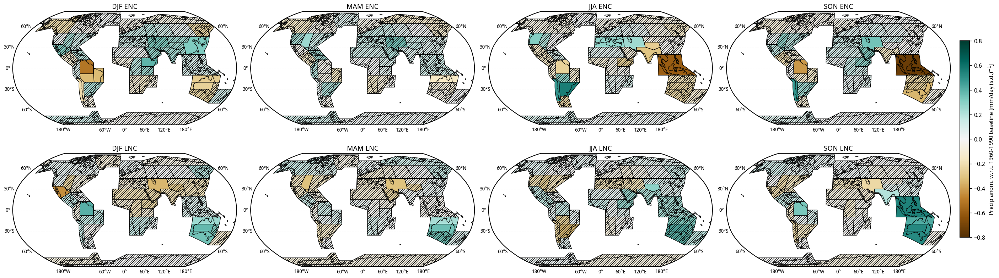

In [61]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-0.8, vmax=0.8, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/day (s.d.)$^{-1}$]', pval_mme = pval_list, \
     nrows=2, ncols=4, figsize=(28,8), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/seasonal_figures/mme_enso_change.png', dpi=300, bbox_inches='tight')

In [62]:
plot_list = [mme_ds.isel(season = 1).asymm, 
             mme_ds.isel(season = 2).asymm,
             mme_ds.isel(season = 3).asymm,
             mme_ds.isel(season = 4).asymm]

In [63]:
pval_list = [mme_ds.isel(season = 1).sign_ratio.to_numpy(), 
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy()]

pval_list1 = [mme_ds.isel(season = 1).enc_sign_ratio.to_numpy(), 
              mme_ds.isel(season = 2).enc_sign_ratio.to_numpy(),
              mme_ds.isel(season = 3).enc_sign_ratio.to_numpy(),
              mme_ds.isel(season = 4).enc_sign_ratio.to_numpy()]

pval_list2 = [mme_ds.isel(season = 1).lnc_sign_ratio.to_numpy(), 
              mme_ds.isel(season = 2).lnc_sign_ratio.to_numpy(),
              mme_ds.isel(season = 3).lnc_sign_ratio.to_numpy(),
              mme_ds.isel(season = 4).lnc_sign_ratio.to_numpy()]

In [64]:
title_list = ['DJF ASYMM', 'MAM ASYMM', 'JJA ASYMM', 'SON ASYMM']

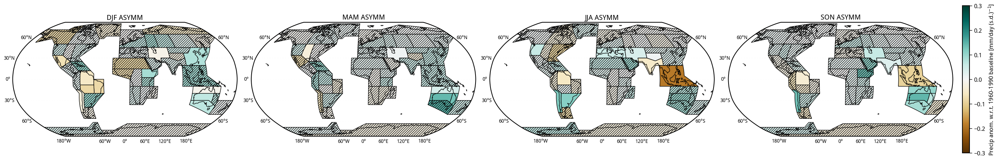

In [65]:
plot2(plot_list, title_list, mpl.cm.BrBG, vmin=-0.3, vmax=0.3, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/day (s.d.)$^{-1}$]', pval1 = pval_list1, \
     pval2 = pval_list2, kind='sign_ratio', nrows=1, ncols=4, figsize=(28,6), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/seasonal_figures/mme_asymm.png', dpi=300, bbox_inches='tight')

##### some other plots

In [72]:
mme_df = mme_ds.to_dataframe()

In [73]:
obs_df = out.isel(model = -2).to_dataframe()

In [74]:
def fix_df(df):
    df['season'] = [i[1] for i in df.index]
    df['region'] = [i[0] for i in df.index]
    df.set_index(np.arange(0,230, 1), inplace=True)
    return df

In [75]:
mme_df = fix_df(mme_df)
obs_df = fix_df(obs_df)

In [76]:
mme_df['model'] = ['mme']*230

In [77]:
mme_df

,std_dev,clim,corr_coef,nino,nina,neut,en_events,ln_events,neut_events,threshold,enc,lnc,asymm,symm,sign_ratio,enc_sign_ratio,lnc_sign_ratio,season,region,model
0,3.418683,35.099089,0.015301,0.001959,-0.053304,-0.002806,15.60,14.80,49.54,0.973569,0.004765,-0.050498,-0.022867,0.027632,0.10,0.04,0.06,ANN,Greenland/Iceland,mme
1,9.275044,30.203703,0.047292,0.021532,-0.070934,0.011569,21.88,23.94,36.88,0.973569,0.009962,-0.082504,-0.036271,0.046233,0.24,0.04,0.12,DJF,Greenland/Iceland,mme
2,8.404843,28.717856,0.079405,0.067956,-0.052957,-0.003648,17.70,16.66,44.04,0.973569,0.071604,-0.049309,0.011148,0.060456,0.22,0.06,0.08,MAM,Greenland/Iceland,mme
3,11.764210,40.636198,0.013644,0.001654,0.048766,-0.004061,13.00,11.28,53.58,0.973569,0.005715,0.052827,0.029271,-0.023556,0.04,0.04,0.04,JJA,Greenland/Iceland,mme
4,12.318370,40.857697,-0.043969,-0.038775,0.032374,-0.005170,17.86,18.84,44.62,0.973569,-0.033606,0.037543,0.001969,-0.035575,0.14,0.04,0.08,SON,Greenland/Iceland,mme
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,3.261332,38.014540,0.135563,0.250316,-0.127695,-0.038018,15.60,14.80,49.54,0.973569,0.288333,-0.089677,0.099328,0.189005,0.40,0.30,0.10,ANN,W.Antarctica,mme
226,8.508491,29.310852,0.137686,0.113534,-0.077052,-0.009944,21.88,23.94,36.88,0.973569,0.123479,-0.067108,0.028185,0.095293,0.40,0.10,0.16,DJF,W.Antarctica,mme
227,11.070991,45.409047,0.100466,0.105716,-0.087173,-0.008663,17.70,16.66,44.04,0.973569,0.114379,-0.078509,0.017935,0.096444,0.24,0.10,0.02,MAM,W.Antarctica,mme
228,10.521542,41.374665,0.051122,0.071373,0.011677,-0.019500,13.00,11.28,53.58,0.973569,0.090873,0.031178,0.061026,0.029848,0.20,0.14,0.06,JJA,W.Antarctica,mme


In [78]:
import pandas as pd

In [79]:
stack = pd.concat([obs_df, mme_df], axis=0)
stack

,std_dev,clim,corr_coef,pval,nino,nina,neut,enc_pval,lnc_pval,en_events,...,model,enc,lnc,asymm,symm,season,region,sign_ratio,enc_sign_ratio,lnc_sign_ratio
0,2.858186,27.660393,0.024803,0.791561,-0.030472,0.042023,-0.005543,0.638198,0.950275,19.00,...,obs,-0.024929,0.047566,0.011319,-0.036247,ANN,Greenland/Iceland,NaN,NaN,NaN
1,7.059069,25.273886,-0.078616,0.403636,-0.068937,0.093417,-0.045140,0.892718,0.482629,29.00,...,obs,-0.023796,0.138557,0.057381,-0.081177,DJF,Greenland/Iceland,NaN,NaN,NaN
2,5.895961,21.221461,0.056340,0.549802,0.024924,-0.241478,0.007117,0.718326,0.280364,18.00,...,obs,0.017807,-0.248595,-0.115394,0.133201,MAM,Greenland/Iceland,NaN,NaN,NaN
3,8.745159,29.654260,-0.082956,0.378099,-0.066951,0.260568,-0.030567,0.651477,0.479646,10.00,...,obs,-0.036384,0.291135,0.127375,-0.163759,JJA,Greenland/Iceland,NaN,NaN,NaN
4,8.283512,34.376005,0.182285,0.051199,0.115547,-0.204324,0.018955,0.622621,0.204008,17.00,...,obs,0.096592,-0.223279,-0.063343,0.159936,SON,Greenland/Iceland,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,3.261332,38.014540,0.135563,NaN,0.250316,-0.127695,-0.038018,NaN,NaN,15.60,...,mme,0.288333,-0.089677,0.099328,0.189005,ANN,W.Antarctica,0.40,0.30,0.10
226,8.508491,29.310852,0.137686,NaN,0.113534,-0.077052,-0.009944,NaN,NaN,21.88,...,mme,0.123479,-0.067108,0.028185,0.095293,DJF,W.Antarctica,0.40,0.10,0.16
227,11.070991,45.409047,0.100466,NaN,0.105716,-0.087173,-0.008663,NaN,NaN,17.70,...,mme,0.114379,-0.078509,0.017935,0.096444,MAM,W.Antarctica,0.24,0.10,0.02
228,10.521542,41.374665,0.051122,NaN,0.071373,0.011677,-0.019500,NaN,NaN,13.00,...,mme,0.090873,0.031178,0.061026,0.029848,JJA,W.Antarctica,0.20,0.14,0.06


In [80]:
# stack['asymm'] = (stack['asymm']/stack['clim'])*100
# stack['enc'] = (stack['enc']/stack['clim'])*100
# stack['lnc'] = (stack['lnc']/stack['clim'])*100
# stack['nino'] = (stack['nino']/stack['clim'])*100
# stack['nina'] = (stack['nina']/stack['clim'])*100
# stack['neut'] = (stack['neut']/stack['clim'])*100

In [81]:
plt.rcParams['hatch.color'] = 'k'

In [82]:
def draw_hatch(ax, hatches):
    for hatch_pattern, these_bars in zip(hatches, ax.containers):
        for this_bar in these_bars:
            this_bar.set_hatch(3*hatch_pattern)

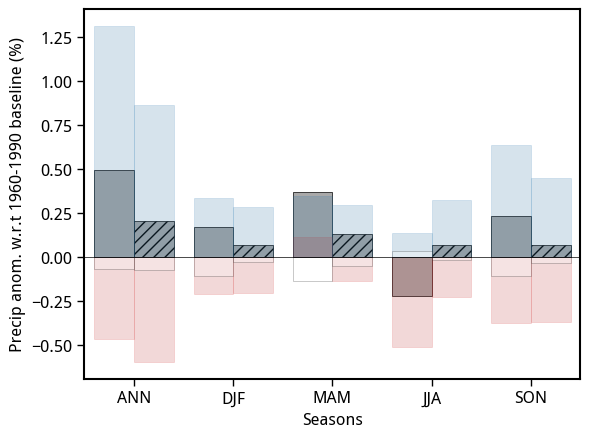

In [85]:
ax = sns.barplot(stack.loc[stack['region'] == 'E.Australia'], x = 'season', y='asymm', hue = 'model', \
                 palette=['darkgray', 'darkgray'], edgecolor='k', linewidth=0.5)
hatches = ['', '/']
draw_hatch(ax, hatches)
ax1 = sns.barplot(stack.loc[stack['region'] == 'E.Australia'], x = 'season', y='nino', hue = 'model', \
                 palette=['tab:red', 'tab:red'], alpha = 0.2, edgecolor='tab:red', linewidth=0.5)
draw_hatch(ax1, hatches)
ax2 = sns.barplot(stack.loc[stack['region'] == 'E.Australia'], x = 'season', y='nina', hue = 'model', \
                 palette=['tab:blue', 'tab:blue'], alpha = 0.2, edgecolor='tab:blue', linewidth=0.5)
draw_hatch(ax2, hatches)
ax3 = sns.barplot(stack.loc[stack['region'] == 'E.Australia'], x = 'season', y='neut', hue = 'model', \
                 palette=['white', 'white'], alpha = 0.3, edgecolor='k', linewidth=0.5)
draw_hatch(ax3, hatches)
            
        
        
# for hatch_pattern, these_bars in zip(hatches, ax2.containers):
#     for this_bar in these_bars:
#         this_bar.set_hatch(3 * hatch_pattern)
# plt.ylim(-10, 40)
plt.legend(labels = [],frameon=False, fontsize=10, loc = 'upper left')
plt.gca().set_xticklabels(['ANN', 'DJF', 'MAM', 'JJA', 'SON'])
plt.ylabel('Precip anom. w.r.t 1960-1990 baseline (%)')
plt.xlabel('Seasons')
plt.axhline(0, lw=0.5, color='k')
# plt.savefig(save_loc+'naus_mme_obs_diff.png', dpi=300, bbox_inches='tight')

In [86]:
import random
random.seed(42)
get_colors = lambda n: ["#%06x" % random.randint(0, 0xFFFFFF) for _ in range(n)]
# get_colors(46)

<AxesSubplot:xlabel='season', ylabel='sign_ratio'>

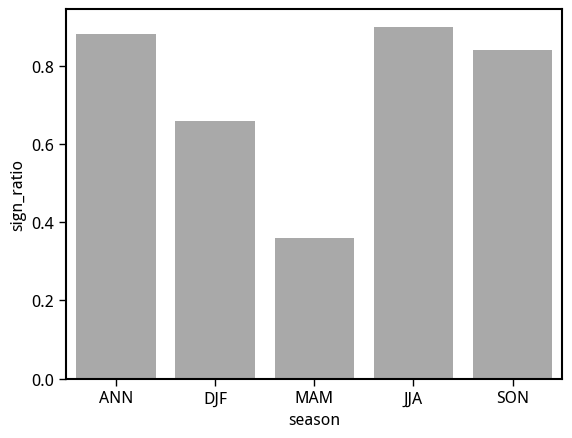

In [87]:
sns.barplot(mme_df.loc[mme_df['region'] == 'S.Asia'], x='season', y='sign_ratio', linewidth=0.5, color='darkgray')
# plt.ylim(0, 1.0)

In [186]:
mme_ds.sign_ratio.max('region')

<xarray.DataArray 'sign_ratio' (season: 5)>
array([0.96, 0.5 , 0.86, 0.92, 0.96])
Coordinates:
  * season   (season) object 'ANN' 'DJF' 'MAM' 'JJA' 'SON'